# Machine Learning in a Nutshell
05.12.2019

**Marco Kemmerling, Chrismarie Enslin**   
**Cybernetics Lab IMA & IfU**

# Data Exploration

## Data Import

In [17]:
import pandas as pd
df_data = pd.read_csv('Gear_Shaft_Dataset.csv', delimiter=';', header=0)
df_data.head()

,Turning_Cut_Depth,Milling_Gear_Depth,Drilling_Surf_Quality,Drill_Pressure,Turning_Rotation_Speed,Drilling_Speed,Milling_Circle_Diameter,Turning_Cut_Speed,Drilling_Diameter,Turning_Shaft_Diameter,class
0,0.637494,0.310224,0.004732,3.493444,38.438535,42.662545,49.151251,1.244546,1.458960,0.100880,OK
1,0.652844,0.320212,0.004732,1.274442,39.551515,43.531334,49.179602,1.312920,1.522850,0.100293,OK
2,0.617482,0.288820,0.003994,1.729314,37.690105,43.455439,49.172410,1.199105,1.517454,0.102054,OK
3,0.595691,0.290698,0.005260,4.746772,38.070763,43.163878,49.167025,1.222921,1.495762,0.100000,OK
4,0.603474,0.309191,0.003827,1.961616,38.626447,42.834841,49.169505,1.257468,1.470745,0.101174,OK


In [18]:
df_data.columns

Index(['Turning_Cut_Depth', 'Milling_Gear_Depth', 'Drilling_Surf_Quality',
       'Drill_Pressure', 'Turning_Rotation_Speed', 'Drilling_Speed',
       'Milling_Circle_Diameter', 'Turning_Cut_Speed', 'Drilling_Diameter',
       'Turning_Shaft_Diameter', 'class'],
      dtype='object')

In [25]:
df_data_enc.shape

(10000, 11)

Summarise data to get an overview of each variable:

In [19]:
df_data.describe()

,Turning_Cut_Depth,Milling_Gear_Depth,Drilling_Surf_Quality,Drill_Pressure,Turning_Rotation_Speed,Drilling_Speed,Milling_Circle_Diameter,Turning_Cut_Speed,Drilling_Diameter,Turning_Shaft_Diameter
count,9989.000000,9991.000000,9990.000000,9976.000000,9988.000000,9987.000000,9988.000000,9987.000000,9987.000000,9991.000000
mean,0.620283,0.317660,0.518787,2.992198,31.668279,43.587005,49.155461,0.830850,1.526328,0.425099
std,0.052734,0.039477,0.284308,1.146554,4.073884,2.171858,0.181184,0.248838,0.160293,0.225916
min,0.438529,0.200000,0.000000,1.000000,20.000000,37.907771,34.154053,0.100000,1.108587,0.100000
25%,0.586970,0.294798,0.316480,2.008489,28.683045,42.067167,49.143034,0.648005,1.414750,0.209888
50%,0.622533,0.310770,0.495771,2.970487,31.775417,43.504936,49.161670,0.836492,1.520169,0.527054
75%,0.648649,0.339918,0.722019,3.979186,34.954364,45.221185,49.174364,1.031588,1.646402,0.628140
max,0.800000,0.443355,1.000000,5.000000,41.874653,50.000000,50.000000,1.463049,1.997237,1.184624


Investigate the class labels, determine how large each class is:

In [23]:
df_data['class'].value_counts()

OK         5009
Failure    4991
Name: class, dtype: int64

# Data preprocessing

## Handling NAs

Check which columns have NA values:

In [28]:
df_data.isna().sum()

Turning_Cut_Depth          11
Milling_Gear_Depth          9
Drilling_Surf_Quality      10
Drill_Pressure             24
Turning_Rotation_Speed     12
Drilling_Speed             13
Milling_Circle_Diameter    12
Turning_Cut_Speed          13
Drilling_Diameter          13
Turning_Shaft_Diameter      9
class                       0
dtype: int64

In [31]:
df_data_clean = df_data.dropna(how = 'any')
df_data_clean.shape

(9876, 11)

## Encoding

In [37]:
from sklearn import preprocessing

encoder = preprocessing.LabelEncoder()

encoder.fit(df_data_clean['class'])

list(encoder.classes_)

df_data_clean['class'] = encoder.transform(df_data_clean['class'])

df_data_clean['class'].head()
print(df_data_clean['class'].value_counts())
#df_data_enc['class'] = df_data_enc['class'].map({'OK':1, 'Failure':0})
#df_data_enc['class'].head()

0    1
1    1
2    1
3    1
4    1
Name: class, dtype: int32

## Data Visualization

### Histograms

C:\Users\oq039832\.conda\envs\pentatunewizard\lib\site-packages\numpy\lib\histograms.py:824: RuntimeWarning:

invalid value encountered in greater_equal

C:\Users\oq039832\.conda\envs\pentatunewizard\lib\site-packages\numpy\lib\histograms.py:825: RuntimeWarning:

invalid value encountered in less_equal



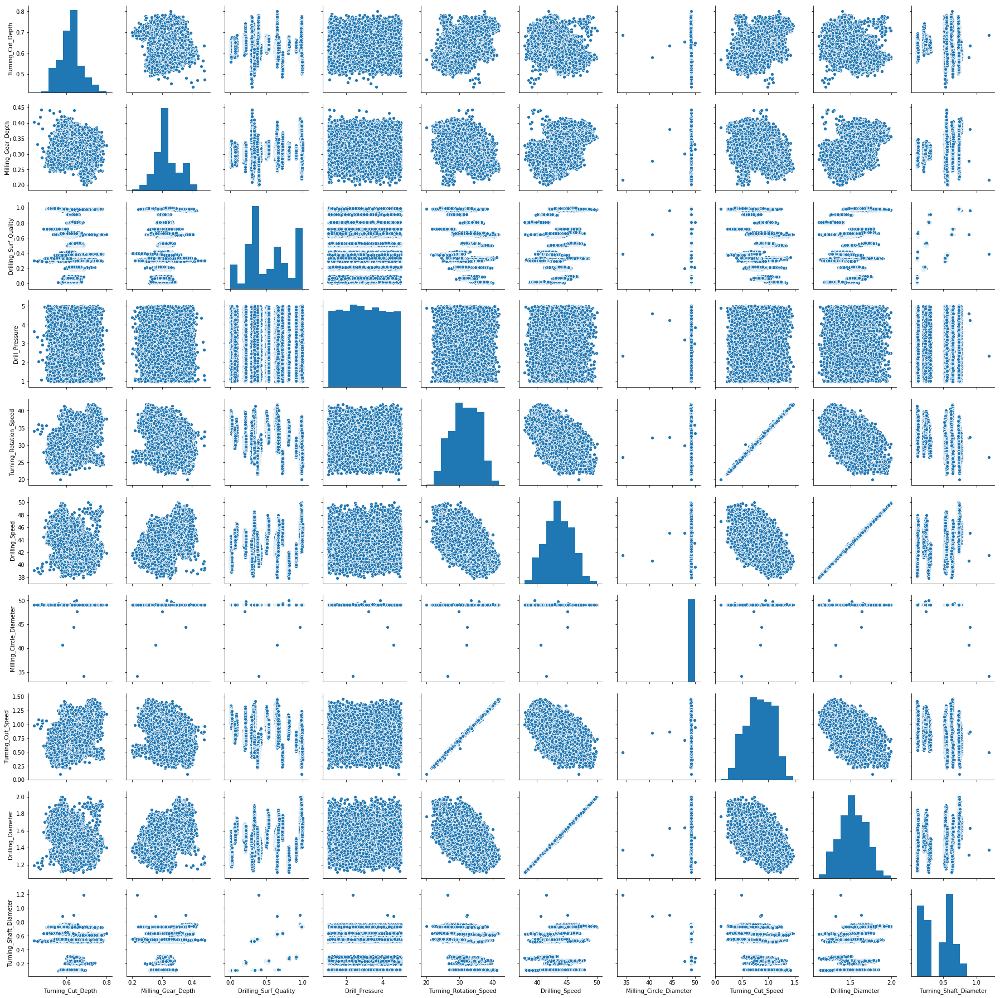

In [9]:
import numpy as np
import seaborn as sns
import matplotlib
from matplotlib import pyplot as plt

sns.pairplot(df_data)

In [3]:
import plotly as py
import plotly.graph_objs as go
from plotly import tools
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import ipywidgets as widgets
import numpy as np
init_notebook_mode(connected=True)

def plot_histograms(bins):
    figHists = tools.make_subplots(rows=3, cols=4)
    counter = 0
    for row in range(3):
        for col in range(4):
            hist = go.Histogram(x = df_data.iloc[::10, counter], 
                                name = df_data.columns.values[counter],
                                nbinsx = bins
                               )

            figHists.append_trace(hist, row+1, col+1)

            counter += 1
            if counter == 11:
                break
    layout = go.Layout(bargap=0.1)
    fig = go.Figure(data=figHists, layout=layout)
    py.offline.iplot(fig)

bin_slider = widgets.IntSlider(value=30, min=3, max=50, step=1)
_=widgets.interact(plot_histograms, bins=bin_slider)

interactive(children=(IntSlider(value=30, description='bins', max=50, min=3), Output()), _dom_classes=('widget…

### Correlation-Matrix

In [4]:
corrData = df_data.corr().abs()
layoutHeatmap = go.Layout(
    title="Pearson Correlation Heatmap",
    height = 650,
    width = 750,
    xaxis = go.layout.XAxis(automargin=True),
    yaxis = go.layout.YAxis(automargin=True)
    )
corr1 = go.Heatmap(z=corrData.iloc[::-1],
                   x=corrData.columns.values,
                   y=corrData.index.values[::-1],
                   colorscale = 'Viridis')
figCorr1=go.Figure(data=[corr1],
                   layout=layoutHeatmap)
py.offline.iplot(figCorr1)

### Scatterplot Matrix

In [5]:
import plotly.figure_factory as ff
fig = ff.create_scatterplotmatrix(df_data.iloc[::20, [0, 2, 3, 4, 6, 7, -1]],
                                  index = 'class',
                                  colormap = ['#bcbddc', '#d95f0e'],
                                  size = 2,
                                  # diag='histogram',
                                  opacity = 0.7,
                                  height = 1000,
                                  width = 1000
                                  )
py.offline.iplot(fig, filename='Basic Scatterplot Matrix')

C:\Users\oq039832\.conda\envs\pentatunewizard\lib\site-packages\plotly\tools.py:465: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead

